## Import Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os, sys
import cv2
import torch, torchvision

## Load dataset

In [23]:
def create_dataset(image_paths, label_paths):
    dataset = []
    for i in range(len(image_paths)):
        image_path = image_paths[i]
        label_path = label_paths[i]

        # Load image and label
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        label = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)

        # # Convert to tensor
        # image = torch.tensor(image, dtype=torch.float32)
        # label = torch.tensor(label, dtype=torch.float32)

        # Append to dataset
        dataset.append((image, label))
    return dataset

# Directories
data_dir = "../data/data_S1/"
train_dir = os.path.join(data_dir, "train")
test_dir = os.path.join(data_dir, "test")

train_img_dir = os.path.join(train_dir, "images")
test_img_dir = os.path.join(test_dir, "images")

train_lbl_dir = os.path.join(train_dir, "labels")
test_lbl_dir = os.path.join(test_dir, "labels")

# Get list of image and label file paths
train_img_paths = sorted([os.path.join(train_img_dir, file) for file in os.listdir(train_img_dir)])
test_img_paths = sorted([os.path.join(test_img_dir, file) for file in os.listdir(test_img_dir)])
train_lbl_paths = sorted([os.path.join(train_lbl_dir, file) for file in os.listdir(train_lbl_dir)])
test_lbl_paths = sorted([os.path.join(test_lbl_dir, file) for file in os.listdir(test_lbl_dir)])

In [24]:
# step 1: create Dataset objects
train_dataset = create_dataset(train_img_paths, train_lbl_paths)
test_dataset = create_dataset(test_img_paths, test_lbl_paths)

dataset = {'train' : train_dataset, 'test' : test_dataset}

Let's take a look at the dataset in more detail. It has a train and validation split:

In [25]:
dataset

{'train': [(array([[16, 16, 16, ..., 16, 16, 16],
          [ 2,  2,  2, ...,  2,  2,  2],
          [ 0,  0,  0, ...,  0,  0,  0],
          ...,
          [ 0,  0,  0, ...,  0,  0,  0],
          [ 0,  0,  0, ...,  0,  0,  0],
          [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8),
   array([[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)),
  (array([[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
   array([[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]], dtype=ui

Let's take a look at a training example:

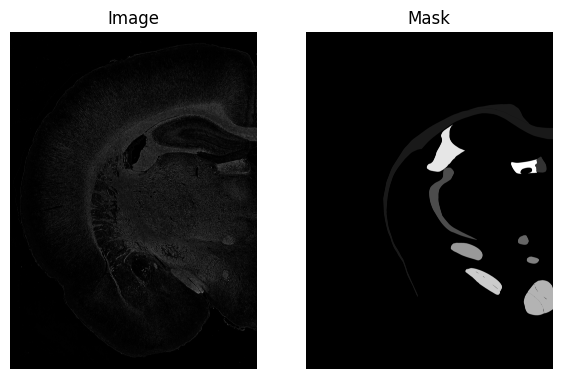

In [29]:
# display an example from training dataset
image, label = dataset['train'][1]
# display both image and label
plt.figure(figsize=(7, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(label, cmap='gray')
plt.title('Mask')
plt.axis('off')
plt.show()

In case of semantic segmentation, every pixel is labeled with a certain class. 0 is the "background" class.

We can visualize the segmentation map on top of the image, like so:

ValueError: [21, 173, 20] is not a valid value for color

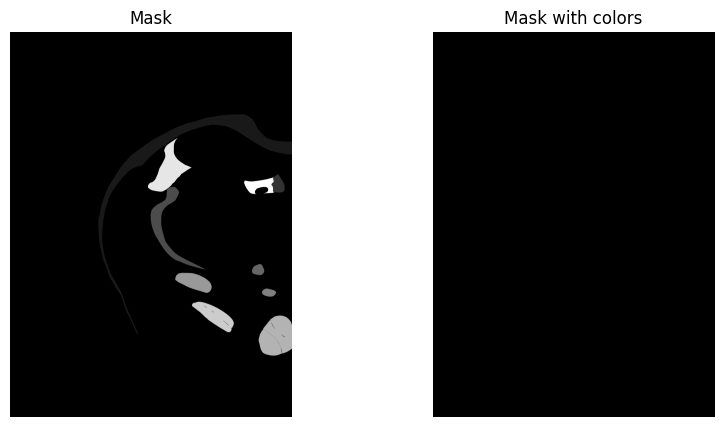

In [30]:
labels = [x for x in range(1,11)]# map every class to a random color
labels_color = {k: list(np.random.choice(range(256), size=3)) for k in labels}
# display mask with classes and their associated colors
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(label, cmap='gray')
plt.title('Mask')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(np.zeros_like(label), cmap='gray')
plt.title('Mask with colors')
plt.axis('off')
for k, v in labels_color.items():
    plt.text(0, k, f'Class {k}', color=v, fontsize=12)
plt.show()



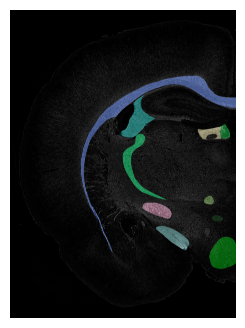

In [51]:
def visualize_map(image, segmentation_map):
    color_seg = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
    for label, color in labels_color.items():
        color_seg[segmentation_map == label, :] = color

    # Show image + mask
    img = np.array(image) * 1 + color_seg * 0.5
    img = img.astype(np.uint8)

    plt.figure(figsize=(10, 4))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

visualize_map(image, segmentation_map)

## Create PyTorch dataset

In [54]:
from torch.utils.data import Dataset

class SegmentationDataset(Dataset):
  def __init__(self, dataset, transform):
    self.dataset = dataset
    self.transform = transform

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    original_image = np.array(item["image"])
    original_segmentation_map = np.array(item["label"])

    transformed = self.transform(image=original_image, mask=original_segmentation_map)
    image, target = torch.tensor(transformed['image']), torch.LongTensor(transformed['mask'])

    # convert to C, H, W
    image = image.permute(2,0,1)

    return image, target, original_image, original_segmentation_map

Let's create the training and validation datasets (note that we only randomly crop for training images).

In [55]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

train_transform = A.Compose([
    # hadded an issue with an image being too small to crop, PadIfNeeded didn't help...
    # if anyone knows why this is happening I'm happy to read why
    # A.PadIfNeeded(min_height=448, min_width=448),
    # A.RandomResizedCrop(height=448, width=448),
    A.Resize(width=448, height=448),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
], is_check_shapes=False)

test_transform = A.Compose([
    A.Resize(width=448, height=448),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),

], is_check_shapes=False)

train_dataset = SegmentationDataset(dataset["train"], transform=train_transform)
test_dataset = SegmentationDataset(dataset["test"], transform=test_transform)

In [56]:
pixel_values, target, original_image, original_segmentation_map = train_dataset[3]
print(pixel_values.shape)
print(target.shape)

torch.Size([3, 448, 448])
torch.Size([448, 448])


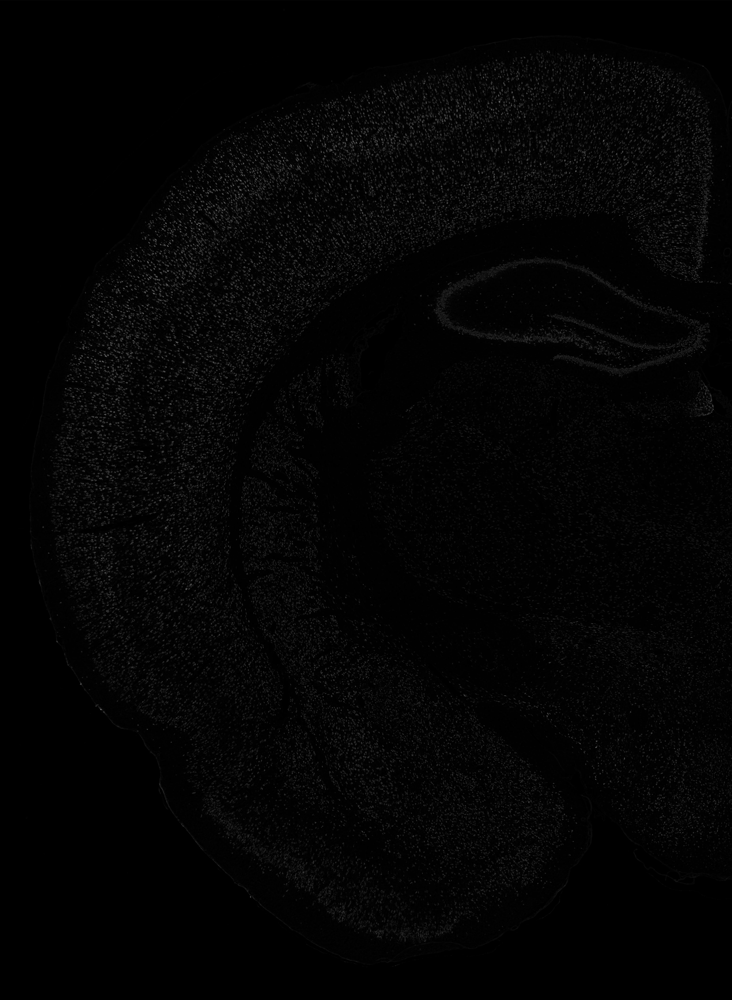

In [57]:
from PIL import Image

Image.fromarray(original_image)

In [60]:
[labels[id-1] for id in np.unique(original_segmentation_map).tolist()]

[10, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

## Create PyTorch dataloaders

Next, we create PyTorch dataloaders, which allow us to get batches of data (as neural networks are trained on batches using stochastic gradient descent or SGD). We just stack the various images and labels along a new batch dimension.

In [61]:
from torch.utils.data import DataLoader

def collate_fn(inputs):
    batch = dict()
    batch["pixel_values"] = torch.stack([i[0] for i in inputs], dim=0)
    batch["labels"] = torch.stack([i[1] for i in inputs], dim=0)
    batch["original_images"] = [i[2] for i in inputs]
    batch["original_segmentation_maps"] = [i[3] for i in inputs]
    return batch

train_dataloader = DataLoader(train_dataset, batch_size=3, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(test_dataset, batch_size=3, shuffle=False, collate_fn=collate_fn)

Let's check a batch:

In [62]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v,torch.Tensor):
    print(k,v.shape)

pixel_values torch.Size([3, 3, 448, 448])
labels torch.Size([3, 448, 448])


Note that the pixel values are float32 tensors, whereas the labels are long tensors:

In [63]:
batch["pixel_values"].dtype

torch.float32

In [64]:
batch["labels"].dtype

torch.int64

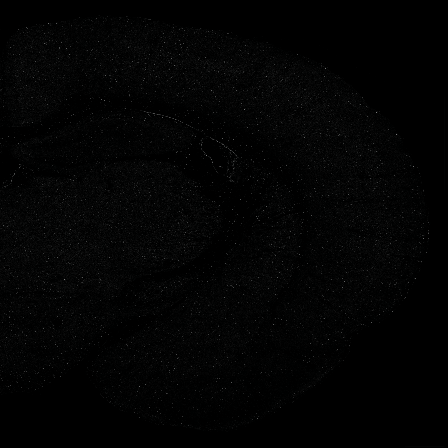

In [65]:
from PIL import Image

unnormalized_image = (batch["pixel_values"][0].numpy() * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = Image.fromarray(unnormalized_image)
unnormalized_image

In [66]:
[labels[id-1] for id in torch.unique(batch["labels"][0]).tolist()]

[10, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

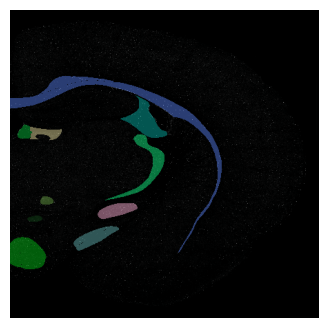

In [67]:
visualize_map(unnormalized_image, batch["labels"][0].numpy())

## Define model

Next, we define the model, which consists of DINOv2 as backbone + a linear classifier on top. DINOv2 is a regular vision transformer, hence it outputs "patch embeddings", meaning an embedding vector for each image patch. Since we use an image resolution of 448 pixels, and we use a DINOv2 model that has a patch resolution of 14 as seen [here](https://huggingface.co/facebook/dinov2-base/blob/main/config.json#L19), we get (448/14)**2 = 1024 patches out. So the model outputs a tensor of shape (batch_size, number of patches, hidden_size) = (batch_size, 1024, 768) for a batch of images (the model has a hidden size - also called embedding dimension - of 768 as seen [here](https://huggingface.co/facebook/dinov2-base/blob/main/config.json#L9)).

Next, we reshape this tensor to become (batch_size, 32, 32, 768), after which we apply the linear layer (below implemented as a Conv2D layer - which is equivalent to a linear transformation when you employ a kernel size of 1x1). This conv2D layer converts the patch embeddings into a logits tensor of shape (batch_size, num_labels, height, width) - which is what we need for semantic segmentation. This tensor contains scores as predicted by the model for all of the classes, for each pixel, for every example in the batch.

In [69]:
!pip install transformers

In [70]:
import torch
from transformers import Dinov2Model, Dinov2PreTrainedModel
from transformers.modeling_outputs import SemanticSegmenterOutput

class LinearClassifier(torch.nn.Module):
    def __init__(self, in_channels, tokenW=32, tokenH=32, num_labels=1):
        super(LinearClassifier, self).__init__()

        self.in_channels = in_channels
        self.width = tokenW
        self.height = tokenH
        self.classifier = torch.nn.Conv2d(in_channels, num_labels, (1,1))


    def forward(self, embeddings):
        embeddings = embeddings.reshape(-1, self.height, self.width, self.in_channels)
        embeddings = embeddings.permute(0,3,1,2)

        return self.classifier(embeddings)


class Dinov2ForSemanticSegmentation(Dinov2PreTrainedModel):
  def __init__(self, config):
    super().__init__(config)

    self.dinov2 = Dinov2Model(config)
    self.classifier = LinearClassifier(config.hidden_size, 32, 32, config.num_labels)

  def forward(self, pixel_values, output_hidden_states=False, output_attentions=False, labels=None):
    # use frozen features
    outputs = self.dinov2(pixel_values,
                            output_hidden_states=output_hidden_states,
                            output_attentions=output_attentions)
    # get the patch embeddings - so we exclude the CLS token
    patch_embeddings = outputs.last_hidden_state[:,1:,:]

    # convert to logits and upsample to the size of the pixel values
    logits = self.classifier(patch_embeddings)
    logits = torch.nn.functional.interpolate(logits, size=pixel_values.shape[2:], mode="bilinear", align_corners=False)

    loss = None
    if labels is not None:
      # important: we're going to use 0 here as ignore index instead of the default -100
      # as we don't want the model to learn to predict background
      loss_fct = torch.nn.CrossEntropyLoss(ignore_index=0)
      loss = loss_fct(logits.squeeze(), labels.squeeze())

    return SemanticSegmenterOutput(
        loss=loss,
        logits=logits,
        hidden_states=outputs.hidden_states,
        attentions=outputs.attentions,
    )

RuntimeError: Failed to import transformers.models.dinov2.modeling_dinov2 because of the following error (look up to see its traceback):
cannot import name 'is_hqq_available' from 'transformers.utils' (/usr/local/lib/python3.10/dist-packages/transformers/utils/__init__.py)

We can instantiate the model as follows:

In [ ]:
model = Dinov2ForSemanticSegmentation.from_pretrained("facebook/dinov2-base", id2label=id2label, num_labels=len(id2label))

Important: we don't want to train the DINOv2 backbone, only the linear classification head. Hence we don't want to track any gradients for the backbone parameters. This will greatly save us in terms of memory used:

In [ ]:
for name, param in model.named_parameters():
  if name.startswith("dinov2"):
    param.requires_grad = False

Let's perform a forward pass on a random batch, to verify the shape of the logits, verify we can calculate a loss:

In [ ]:
outputs = model(pixel_values=batch["pixel_values"], labels=batch["labels"])
print(outputs.logits.shape)
print(outputs.loss)

As can be seen, the logits are of shape (batch_size, num_labels, height, width). We can then just take the highest logit (score) for each pixel as the model's prediction.

## Train the model

We'll train the model in regular PyTorch fashion. We also use the mIoU (mean Intersection-over-Union) metric to evaluate the performance during training.

Note that I made this entire notebook just for demo purposes, I haven't done any hyperparameter tuning, so feel free to improve. You can also of course use other training frameworks (like the 🤗 Trainer, PyTorch Lightning, 🤗 Accelerate, ...).

In [ ]:
import evaluate

metric = evaluate.load("mean_iou")

In [ ]:
from torch.optim import AdamW
from tqdm.auto import tqdm

# training hyperparameters
# NOTE: I've just put some random ones here, not optimized at all
# feel free to experiment, see also DINOv2 paper
learning_rate = 5e-5
epochs = 2

optimizer = AdamW(model.parameters(), lr=learning_rate)

# put model on GPU (set runtime to GPU in Google Colab)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# put model in training mode
model.train()

for epoch in range(epochs):
  print("Epoch:", epoch)
  for idx, batch in enumerate(tqdm(train_dataloader)):
      pixel_values = batch["pixel_values"].to(device)
      labels = batch["labels"].to(device)

      # forward pass
      outputs = model(pixel_values, labels=labels)
      loss = outputs.loss

      loss.backward()
      optimizer.step()

      # zero the parameter gradients
      optimizer.zero_grad()

      # evaluate
      with torch.no_grad():
        predicted = outputs.logits.argmax(dim=1)

        # note that the metric expects predictions + labels as numpy arrays
        metric.add_batch(predictions=predicted.detach().cpu().numpy(), references=labels.detach().cpu().numpy())

      # let's print loss and metrics every 100 batches
      if idx % 100 == 0:
        metrics = metric.compute(num_labels=len(id2label),
                                ignore_index=0,
                                reduce_labels=False,
        )

        print("Loss:", loss.item())
        print("Mean_iou:", metrics["mean_iou"])
        print("Mean accuracy:", metrics["mean_accuracy"])

## Inference

Once we've trained a model, we can perform inference on new images as follows:

In [ ]:
from PIL import Image
test_image = dataset["validation"][6]["image"]
test_image

In [ ]:
pixel_values = val_transform(image=np.array(test_image))["image"]
pixel_values = torch.tensor(pixel_values)
pixel_values = pixel_values.permute(2,0,1).unsqueeze(0) # convert to (batch_size, num_channels, height, width)
print(pixel_values.shape)

In [ ]:
# forward pass
with torch.no_grad():
  outputs = model(pixel_values.to(device))

In [ ]:
upsampled_logits = torch.nn.functional.interpolate(outputs.logits,
                                                   size=test_image.size[::-1],
                                                   mode="bilinear", align_corners=False)
predicted_map = upsampled_logits.argmax(dim=1)

In [ ]:
visualize_map(test_image, predicted_map.squeeze().cpu())

This is just an illustrative example (I barely trained the model) but you can clearly see that training is working :) the model is able to segment the rice and sausages properly already on an unseen image.

In [ ]:
torch.save(model, 'model.pt')

In [ ]:
torch.save(model, 'model.pth')